In [2]:
#common
from datetime import datetime, timedelta, date
import time
import pandas as pd
import numpy as np
import langid as lid
import re

#analytic lib
# import ab_calc
import math
import scipy as sc
# import pyexasol

#plotly
import plotly.express as px
import plotly.graph_objs as go
from plotly import tools
import plotly.offline  as py
py.init_notebook_mode(connected=True)

#matplotlib
from matplotlib import pyplot as plt
from matplotlib import rc
import seaborn as sns
%matplotlib inline

# Вводные 

**Общее описание задачи**

Есть данные по контенту, который создают пользователи. Каждая строка в датасете — единица контента. У каждой единицы контента есть некий score, который отражает его “плохость”. 

**Нужно сделать**
- Проанализировать массив данных и подсветить моменты, которые считаешь ключевыми.
- Придумать сегментацию пользователей на основе создаваемого ими контента.
- Предложить, как можно было бы использовать данную сегментацию в проде.
- Подготовить результат в том формате, который посчитаешь нужным.

Будет особенно круто, если поделишься исходными расчетами. Это может быть что угодно: гугл таблица, ноутбук в юпитере, проект на R/Python. 


1) Хотим сделать среду Wakie чище. Люди иногда постят нежелательный контент, некоторые делают это регулярно. Хотим научиться определять таких людей и как-то с ними работать. 

2) Для текстового контента плохость определяется моделью и, по факту, представляет собой вероятность того, что контент пошлый. Для текстового контента значение изменяется от 0 до 1. Где 1 — точно прошлый, 0 — точно не пошлый. Для звонков указаны значения 0,1,5. 0 — человек не получил оценку после звонка, 1 — получил дизлайк, 5 — получил лайк. 

3) Хотим попробовать сегментацию, чтобы научиться выделять конкретные группы людей и в дальнейшем с ними работать. 

4) Единицы контента можно связать только по user_id. Топики с комментами соединить не получится, потому что у последних нет родительского айди


- Топики создаются пользователями и публикуются в основной ленте. Топики могут комментировать другие пользователи

Соответственно комментарий под топиком — коммент

- Да, mod_conf_porno — это элементы, на которые были жалобы и на которые модераторы подтвердили, что это пошлый контент. 

Действительно, модель плохо работает не на англе, потому что она обучалась только на англе

В выборке топики, которые были в английском фиде (ленте). Если там есть не на англе фактически, это значит, что юзер принудительно пушнул топик не на англе в англ фид

- Время в секундах, да

Люди оценивают просто звонок. Примерно как оценивают поездку в такси: нравится, не нравится, все равно

# Посмотрим данные

In [3]:
data = pd.read_csv('wt_data.csv', parse_dates=['created']).iloc[:,1:]

In [4]:
data.head()

,created,content_id,content,quality,user_id,content_type
0,2021-06-03 00:01:49.209,60b81bed33bd2e0d0a26876d,What’s a secret you have?,0.102579,60b81bda33bd2e0d0a2686a1,topic
1,2021-06-04 06:44:27.720,60b9cbcba8e8c52f6f224ea4,any shit but abrahamic religions,0.156906,60b81e6b5c002c655605235c,topic
2,2021-06-04 05:27:05.247,60b9b9a96d0ef34d9207b512,10 layers of filters,0.124180,60b81e6b5c002c655605235c,topic
3,2021-06-04 05:05:08.699,60b9b4846d0ef34d920770ee,Zarathustra sounds like a Sanskrit name\n\nIt'...,0.120621,60b81e6b5c002c655605235c,topic
4,2021-06-03 20:52:53.296,60b9412533bd2e0c40b7f115,why official religion of Malaysia is Islam ?\n...,0.098455,60b81e6b5c002c655605235c,topic


In [5]:
data.info(), data.nunique()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368023 entries, 0 to 368022
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   created       368023 non-null  datetime64[ns]
 1   content_id    368023 non-null  object        
 2   content       368023 non-null  object        
 3   quality       368023 non-null  float64       
 4   user_id       368023 non-null  object        
 5   content_type  368023 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(4)
memory usage: 16.8+ MB


(None,
 created         365140
 content_id      364900
 content         297445
 quality         115875
 user_id           4636
 content_type         4
 dtype: int64)

- Юзеров на самом деле не очень много, они генерят много единиц контента
- У звонков повторяется content_id, потому что в них участвует 2 человека, у комментов и топиков, потому что модерация

In [6]:
# типы контента
100*data.content_type.value_counts(normalize=True),\
data.content_type.value_counts()

(comment           58.462107
 topic             23.110240
 call              18.332006
 mod_conf_porno     0.095646
 Name: content_type, dtype: float64,
 comment           215154
 topic              85051
 call               67466
 mod_conf_porno       352
 Name: content_type, dtype: int64)

In [7]:
data.created.agg(['min', 'max'])

min   2021-06-03 00:01:49.209
max   2021-07-22 11:21:56.073
Name: created, dtype: datetime64[ns]

- Комментов больше всего, что логично. На один топик около 3 комментов. Модерации оч мало

In [8]:
# поисследуем теперь юзеров
data.groupby('content_type').user_id.nunique().sort_values(ascending=False)

content_type
topic             3703
call              2833
comment           2722
mod_conf_porno     152
Name: user_id, dtype: int64

In [9]:
user_to_content_df = data[data.content_type!='mod_conf_porno'][['user_id', 'content_type']].drop_duplicates()\
            .sort_values(['user_id', 'content_type']).rename({'content_type':'content_types'}, axis=1)
100*user_to_content_df.groupby('user_id').content_types.sum()\
            .value_counts(normalize=True)

callcommenttopic    33.843831
topic               18.075928
commenttopic        14.646247
calltopic           13.308887
call                 9.900777
comment              6.169111
callcomment          4.055220
Name: content_types, dtype: float64

- Получается, что пишут чаще комменты, но очень много юзеров, которые создавали только топики (18%) и не писали комменты
- Самый частый сценарий - это использование всех возможностей (34%), на втором месте только создание топиков (те самые 18%), на третьем - создание топиков + комменты (14%) и на 4м - звонки+топики (13%)

In [10]:
# насколько активны в разных категориях
activity_df = data[data.content_type!='mod_conf_porno']\
            .merge(user_to_content_df.groupby('user_id').content_types.sum().reset_index(), 
                    on='user_id')
(activity_df.groupby('content_types').user_id.count()/\
activity_df.groupby('content_types').user_id.nunique()).sort_values(ascending=False)

content_types
callcommenttopic    184.123008
commenttopic         79.051546
callcomment          38.813830
calltopic            14.416532
call                 12.912854
comment               5.681818
topic                 1.625298
Name: user_id, dtype: float64

In [11]:
activity_df.groupby(['content_types', 'content_type']).user_id.count()/\
activity_df.groupby(['content_types', 'content_type']).user_id.nunique()

content_types     content_type
call              call             12.912854
callcomment       call             25.207447
                  comment          13.606383
callcommenttopic  call             31.878904
                  comment         110.274060
                  topic            41.970045
calltopic         call             10.991896
                  topic             3.424635
comment           comment           5.681818
commenttopic      comment          55.892489
                  topic            23.159057
topic             topic             1.625298
Name: user_id, dtype: float64

- наиболее активны люди, которые создают звонки+комменты+топики, комменты+топики и звонки+комменты часто за счет комментов

<AxesSubplot:title={'center':'quality'}, xlabel='content_type'>

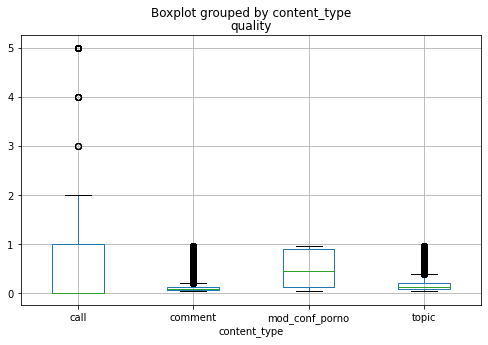

In [12]:
# распределение оценок
data.boxplot(column='quality',by='content_type', figsize=(8,5))

- Звонки распределены по-другому, будем рассматривать их как отдельный тип контента. + у звонков не считается "пошлость по модели"

In [13]:
data_no_calls = data[data.content_type!='call']
data_no_calls['content'] =  data_no_calls['content'].str.lower()

data_calls = data[data.content_type=='call']

<ipython-input-13-c611228af9b3>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Без звонков

<AxesSubplot:title={'center':'quality'}, xlabel='content_type'>

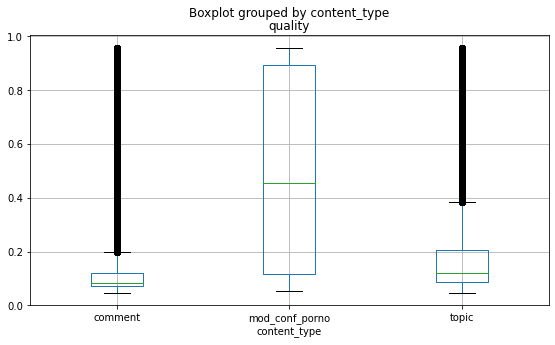

In [14]:
data_no_calls.boxplot(column='quality',by='content_type', figsize=(9,5))

In [15]:
data_no_calls[(data_no_calls.content_type=='comment')].quality.value_counts(normalize=True).iloc[:5],\
data_no_calls[(data_no_calls.content_type=='topic')].quality.value_counts(normalize=True).iloc[:5],\
data_no_calls[(data_no_calls.content_type=='mod_conf_porno')].quality.value_counts(normalize=True).iloc[:5]

(0.070567    0.112315
 0.064984    0.013270
 0.052512    0.008385
 0.050921    0.007213
 0.057750    0.006544
 Name: quality, dtype: float64,
 0.070567    0.011134
 0.954191    0.008454
 0.065615    0.003316
 0.106915    0.003163
 0.080031    0.003139
 Name: quality, dtype: float64,
 0.070567    0.073864
 0.771005    0.031250
 0.141896    0.028409
 0.377356    0.025568
 0.945163    0.017045
 Name: quality, dtype: float64)

In [17]:
px.histogram(data_no_calls[['content_type','quality']], color='content_type')

- Лучше видно, что у комментов в среднем ниже пошлость, чем у топиков, но комментов и больше при этом.
- Тип контента модерации распределен практически равномерно, чуть больше контента с очень низкими и очень высокими оценками. Это говорит о том, что есть беды с моделью. Если посмотреть руками, то у контента с самыми низкими оценками пошлости другой язык. Судя по исходной инфе модель обучалась на англе. Можно попытаться понять английский это или нет и посмотреть как изменится распределение
- Еще выглядит так, будто некоторым строкам искуственно назначили некоторые значения, но это не так важно

In [18]:
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

data_no_calls['is_eng'] = data_no_calls.content.apply(lambda x:1 if lid.classify(str(re.sub('[!@#$?:!/;]', '', 
                            emoji_pattern.sub(r'', x))))[0]=='en' else 0)

<ipython-input-18-50ef27bfad17>:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<AxesSubplot:title={'center':'quality'}, xlabel='content_type'>

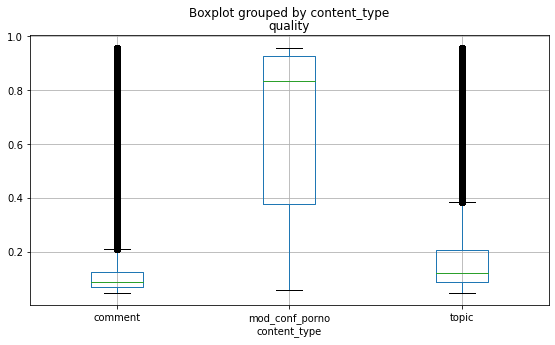

In [19]:
# боксплот на условно английской выборке
data_no_calls_eng = data_no_calls[data_no_calls.is_eng==1]
data_no_calls_eng.boxplot(column='quality',by='content_type', figsize=(9,5))

- Здесь уже видно, что первый квартиль модерированного текста находится довольно высоко, т е выше чем максимальные значения по основной части контента. т е мы уже можем на основе этого что-то делать. Если смотреть руками, то что-то очевидно пошлое появляется после 0.4-0.5, поэтому можем для точности и красоты считать, что пошлое сообщение начинается от 0.5

In [20]:
data_no_calls_eng[data_no_calls_eng.content_type=='mod_conf_porno'].sort_values('quality').iloc[60:62]

,created,content_id,content,quality,user_id,content_type,is_eng
367903,2021-06-08 06:42:16.630,60bdaf416d0ef36ebd417dee,what should i do ?\nneck bite or liking pussy?,0.501163,60bc57756d0ef36e19dfd2bd,mod_conf_porno,1
367820,2021-06-21 13:47:05.506,60c8fb6733bd2e01f67cef6e,watch full video for sex chat with me: https:/...,0.509791,60bfb8da07919a7af03c9564,mod_conf_porno,1


In [21]:
# посмотрим какие есть особенности по времени, может это что-то даст, а может нет
data_no_calls['created_hour'] = data_no_calls.created.apply(lambda x:str(x)[11:13])

<ipython-input-21-dac83a6d74e7>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [22]:
px.bar(data_no_calls.groupby(['content_type','created_hour']).quality.count().reset_index().set_index('created_hour'),
       barmode='group', color='content_type', title='Кол-во контента по часам')

In [23]:
px.bar(data_no_calls[data_no_calls.content_type!='mod_conf_porno'].groupby(['content_type','created_hour']).quality.median().reset_index().set_index('created_hour'),
       barmode='group', color='content_type', title='Медианная "пошлость" контента по часам')

In [24]:
px.bar((data_no_calls[(data_no_calls.quality>0.5)
                      &(data_no_calls.content_type!='mod_conf_porno')]\
    .groupby(['content_type','created_hour']).quality.count()/\
data_no_calls[(data_no_calls.content_type!='mod_conf_porno')]\
    .groupby(['content_type','created_hour']).quality.count()).reset_index().set_index('created_hour'),
       barmode='group', color='content_type', title='Доля нежелательного контента (>0.5) по часам')

In [25]:
px.bar((data_no_calls[(data_no_calls.is_eng==1)&(data_no_calls.quality>0.5)
                      &(data_no_calls.content_type!='mod_conf_porno')]\
    .groupby(['content_type','created_hour']).quality.count()/\
data_no_calls[(data_no_calls.is_eng==1)&(data_no_calls.content_type!='mod_conf_porno')]\
    .groupby(['content_type','created_hour']).quality.count()).reset_index().set_index('created_hour'),
       barmode='group', color='content_type', title='Доля нежелательного контента (>0.5) по часам (eng)')

- Вечером, ближе к ночи и рано утром выше доля нежелательного контента
- Самое частое время для общения - утро до 11 и вечер с 4 до 9
- Начиная с 8 вечера медианная пошлость контента начинает расти

Это ничего не дало, но было интересно

In [26]:
# посмотрим долю плохого контента по разным типам юзеров. берем только комменты и топики

bad_content_thresh = 0.8

data_with_types_df = data_no_calls[data_no_calls.content_type!='mod_conf_porno'].merge(
            user_to_content_df.groupby('user_id').content_types.sum().reset_index(), on='user_id')

bad_content_all_share_from_all = (data_with_types_df[data_with_types_df.quality>bad_content_thresh]\
        .groupby(['content_type']).quality.count()/\
        data_with_types_df[data_with_types_df.quality>bad_content_thresh].quality.count())

bad_content_share_from_all = (data_with_types_df[data_with_types_df.quality>bad_content_thresh]\
        .groupby(['content_types']).quality.count()/\
        data_with_types_df[data_with_types_df.quality>bad_content_thresh].quality.count())

bad_content_share_by_type_from_all = (data_with_types_df[data_with_types_df.quality>bad_content_thresh]\
        .groupby(['content_types', 'content_type']).quality.count()/\
        data_with_types_df[data_with_types_df.quality>bad_content_thresh].quality.count())

bad_content_share_from_group = (data_with_types_df[data_with_types_df.quality>bad_content_thresh]\
                                .groupby(['content_types']).quality.count()/\
                                    data_with_types_df\
                                .groupby(['content_types']).quality.count())

bad_content_share_by_type_from_group = (data_with_types_df[data_with_types_df.quality>bad_content_thresh]\
                                .groupby(['content_types','content_type']).quality.count()/\
                                    data_with_types_df\
                                .groupby(['content_types','content_type']).quality.count())

In [27]:
print("Доля плохого контента: {:.1%}".format(data_with_types_df[data_with_types_df.quality>bad_content_thresh].quality.count()/\
data_with_types_df.quality.count()))

Доля плохого контента: 2.3%


In [28]:
px.bar(bad_content_all_share_from_all, barmode='group', 
       title='Доля пошлого контента по типу контента', height=450, width=600)

In [29]:
px.bar(pd.concat([bad_content_share_from_all,
           bad_content_share_from_group], axis=1, 
                 keys=('share_from_all', 'share_from_group')), barmode='group', 
       title='Доля пошлого контента по типам юзеров', height=450)

In [30]:
px.bar(pd.concat([bad_content_share_by_type_from_all,
           bad_content_share_by_type_from_group], axis=1, 
                 keys=('share_from_all', 'share_from_group')).reset_index('content_type'), barmode='group', 
       title='Доля пошлого контента по типам юзеров и типам контента', height=450,facet_col='content_type')

- БОльшая часть пошлого контента - это все-таки топики, несмотря на то, что комментов оставляют больше
- Самая активная аудитория в плане генерации плохого контента - это люди, которые пользуются всем + те, кто пользуются комментами и топиками
- Есть еще отдельные группы. Это те, кто создают топики и потом совершают звонки - у таких можно проверять качество звонков и банить , если оно плохое. Есть чуваки, которые создают только топики, т е они не общаются в них, что странно. Возможно им никто не отвечает и этих чуваков тоже можно сразу банить

In [31]:
# data_no_calls[(data_no_calls.content_type=='mod_conf_porno')&(data_no_calls.is_eng==1)].sort_values('quality').iloc[:60]

## Звонки

/Users/a.sharonova/opt/anaconda3/lib/python3.8/site-packages/pandas/core/generic.py:5168: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



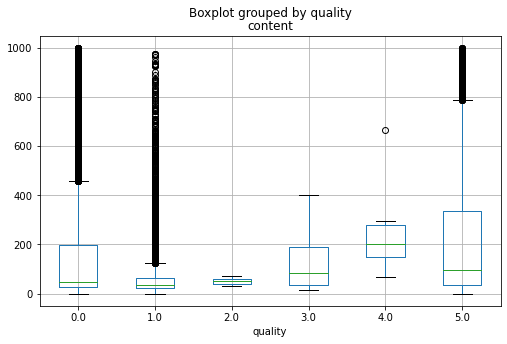

In [32]:
data_calls.content = data_calls.content.astype('float')

data_calls[data_calls.content<1000].boxplot(column='content',by='quality', figsize=(8,5))
px.histogram(data_calls[data_calls.content<1000][['content', 'quality']], color='quality', marginal='box')

- звонки с хорошими оценками обычно длятся дольше
- часто звонки прерываются на 30 секундах, наверно там есть лимит

Будем использовать звонки для определения того, насколько человек хороший или плохой

## Выводы по первой части

In [45]:
data_with_types_df.is_eng.value_counts(normalize=True)

1    0.801006
0    0.198994
Name: is_eng, dtype: float64

**Цель в том, чтоб определять пошлый контент и что-то с ним делать и с юзерами, которые его постят**

### Модель
Модель работает изначально только для английского текста, так что мы можем работать только с 80%-90% контента (определитель языка не очень точный). 

Что можно с этим сделать: 
- дообучить модель на других языках тоже, что достаточно трудоемко
- проанализировать насколько популярны вбросы топиков на другом языке (как часто лайкают, комментируют) и если относительно английских топиков они не популярны, то можно сильно понижать их в ленте или удалять и предупреждать создателя контента о том, что контент можно постить только на языке ленты
- забить

Как использовать модель:
- Если почистить ее от неанглийского контента, то первый квартиль составляет около 0.4, медиана около 0.8. Можем использовать пороги 0.4-0.8 для средне-пошлого контента и >0.8 для пошлого (если посмотреть руками данные, то в целом это адекватная оценка)

### Инсайты по данным

Интресных особенностей много, но отмечу то, что пригодится для дальнейшего ресерча:
- Юзеры генерят достаточно много контента, чаще всего это комменты.
- Основная часть пользователей - это те, кто генерят все типы контента (звонки, комменты, топики), причем эта часть аудитории самая активная.
- Топики - основная часть пошлого контента (в зависимости от порога около 60-75%, остальное комементы)
- По звонкам мы не можем определить пошлость контента, но они могут помочь в другом - определять условный рейтинг пользователя
- Больше всего пошлого контента генерит как раз та аудитория, которая пользуется всем сразу. Именно с ними нужно работать и как раз по ним мы сможем посчитать рейтинг. Из крупных сегментов есть еще те, кто создает топики+комменты и звонки+топики. Последние - это пользователи, которые предлагают секс-звонки.

# Соберем таблицу по юзерам

- айди
- типы контентов
- самый частый тип?
- доля пошлого контента
- кол-во пошлого контента
- доля пошлых комментов от всего контента
- доля пошлых топиков от всего контента
- кол-во звонков с рейтингом
- рейтинг по звонкам

In [125]:
thresh = 0.5

data_with_types_df['is_bad_content'] = np.where(data_with_types_df.quality>thresh,1,0)
data_with_types_df['is_bad_comment'] = np.where((data_with_types_df.quality>thresh)&
                                                (data_with_types_df.content_type=='comment'),1,0)
data_with_types_df['is_bad_topic'] = np.where((data_with_types_df.quality>thresh)&
                                                (data_with_types_df.content_type=='topic'),1,0)

bad_share_user_df = data_with_types_df.groupby('user_id').is_bad_content.mean().reset_index()\
                .rename({'is_bad_content':'bad_content_share'}, axis=1).fillna(0)

bad_cnt_user_df = data_with_types_df.groupby('user_id').is_bad_content.sum().reset_index()\
                .rename({'is_bad_content':'bad_content_cnt'}, axis=1).fillna(0)

bad_comment_share_user_df = data_with_types_df.groupby('user_id').is_bad_comment.mean().reset_index()\
                .rename({'is_bad_comment':'bad_comment_share'}, axis=1).fillna(0)

bad_comment_cnt_user_df = data_with_types_df.groupby('user_id').is_bad_comment.sum().reset_index()\
                .rename({'is_bad_comment':'bad_comment_cnt'}, axis=1).fillna(0)

bad_topic_share_user_df = data_with_types_df.groupby('user_id').is_bad_topic.mean().reset_index()\
                .rename({'is_bad_topic':'bad_topic_share'}, axis=1).fillna(0)

bad_topic_cnt_user_df = data_with_types_df.groupby('user_id').is_bad_topic.sum().reset_index()\
                .rename({'is_bad_topic':'bad_topic_cnt'}, axis=1).fillna(0)

content_user_df = data_with_types_df[['user_id', 'content_types']].drop_duplicates()

call_rating_df = data_calls[data_calls.quality.isin([1,5])].groupby('user_id').quality.mean().reset_index()\
                .rename({'quality':'call_rating'}, axis=1)

call_rating_cnt_df = data_calls[data_calls.quality.isin([1,5])].groupby('user_id').quality.count().reset_index()\
                .rename({'quality':'call_rating_cnt'}, axis=1)

user_df = content_user_df.merge(bad_share_user_df,on='user_id', how='left')\
                .merge(bad_comment_share_user_df,on='user_id', how='left')\
                .merge(bad_topic_share_user_df,on='user_id', how='left')\
                .merge(bad_cnt_user_df,on='user_id', how='left')\
                .merge(bad_comment_cnt_user_df,on='user_id', how='left')\
                .merge(bad_topic_cnt_user_df,on='user_id', how='left')\
                .merge(call_rating_df,on='user_id', how='left')\
                .merge(call_rating_cnt_df,on='user_id', how='left').fillna(0)

user_df['topic_share'] = user_df.bad_topic_cnt/user_df.bad_content_cnt

bad_user_df = user_df[(user_df.bad_content_share>0)]

In [126]:
print('Доля юзеров, которые постят плохой контент: {:.1%}'.format(bad_user_df.user_id.nunique()/data.user_id.nunique()))
print('Доля юзеров, которые постят плохой контент больше двух раз: {:.1%}'.format(
        bad_user_df[bad_user_df.bad_content_cnt>=3].user_id.nunique()/data.user_id.nunique()))
print('--- Доля от всех, кто постит плохой контент: {:.1%}'.format(
        bad_user_df[bad_user_df.bad_content_cnt>=3].user_id.nunique()/bad_user_df.user_id.nunique()))

Доля юзеров, которые постят плохой контент: 28.1%
Доля юзеров, которые постят плохой контент больше двух раз: 15.2%
--- Доля от всех, кто постит плохой контент: 53.9%


Будем считать, что до трех постов мы ничего не делаем, потому что это может быть случайно, или можно отправлять легкие предупреждения

Кажется, что делить юзеров на средне-пошлый и очень пошлый контент - излишнее усложнение, так что будем работать с одной метрикой

In [127]:
bad_user_more2_df = bad_user_df[bad_user_df.bad_content_cnt>=3]

Следующая группа людей - те, кто запостил меньше 10% пошлого контента. В этой группе модель часто ошибается в пошлости. С ними мы не будем делать ничего, потому что вероятнее всего это безобидные разговоры про секс

In [143]:
bad_user_more2_less10_df = bad_user_more2_df[bad_user_more2_df.bad_content_share<0.1]

In [145]:
print('Доля юзеров, которые постят меньше 10% плохого контента (и больше 2х единиц): {:.1%}'.format(
        bad_user_more2_less10_df.user_id.nunique()/data.user_id.nunique()))
print('--- Доля от всех, кто постит плохой контент: {:.1%}'.format(
        bad_user_more2_less10_df.user_id.nunique()/bad_user_df.user_id.nunique()))

Доля юзеров, которые постят меньше 10% плохого контента (и больше 2х единиц): 8.8%
--- Доля от всех, кто постит плохой контент: 31.3%


In [153]:
bad_user_more2_without_less10_df = bad_user_more2_df[bad_user_more2_df.bad_content_share>=0.1]
bad_user_more2_without_less10_df.user_id.nunique()/bad_user_df.user_id.nunique()

0.22622699386503067

У нас остается 22%, с которыми уже надо работать

Следующий этап - это взять людей, у которых доля выше 40%. По данным кажется, что это юзеры, которые постят самую дичь и засоряют контент. С ними как раз надо выработать стратегию работы.

- Можно их банить совсем и возвращать доступ к ленте только спустя какое-то время и следить, что они перестали постить плохой контент 
- Также можно отслеживать жалобы на этих людей и реакции на посты и в зависимости от этого решать банить их навсегда или нет
- Можно не банить, но при этом в реалтайме проверять плохость контента и не давать его постить, если оценка превышает 0.5

In [169]:
print('Доля юзеров, которые постят больше 40% плохого контента (и больше 2х единиц): {:.1%}'.format(
        bad_user_more2_without_less10_df[(bad_user_more2_without_less10_df.bad_content_share>=0.4)].user_id.nunique()\
    /data.user_id.nunique()))
print('--- Доля от всех, кто постит плохой контент: {:.1%}'.format(
        bad_user_more2_without_less10_df[bad_user_more2_without_less10_df.bad_content_share>=0.4].user_id.nunique()/\
    bad_user_df.user_id.nunique()))


Доля юзеров, которые постят больше 40% плохого контента (и больше 2х единиц): 2.0%
--- Доля от всех, кто постит плохой контент: 7.1%


In [170]:
bad_user_more2_less40_df = bad_user_more2_without_less10_df[bad_user_more2_without_less10_df.bad_content_share<0.4]
bad_user_more2_less40_df.user_id.nunique()/bad_user_df.user_id.nunique()

0.1549079754601227

Осталось 15% юзеров, которые находятся в пограничном состянии, так как контент может быть не таким уж плохим. Здесь уже будем определять плохость по рейтингу. Будем брать рейтинги от 2х оценок, чтоб было хоть какое-то альтернативное мнение:)

In [172]:
bad_user_df.user_id.nunique()

1304

In [194]:
bad_user_more2_less40_bad_call_rating_df = bad_user_more2_less40_df[(bad_user_more2_less40_df.call_rating_cnt>=2)&
                         ((bad_user_more2_less40_df.call_rating<3))]

У нас появилась группа людей с плохим рейтингом по звонкам и долей 10-40%

In [191]:
print('Доля юзеров, которые постят меньше 40% плохого контента с плохим рейтингом: {:.1%}'.format(
        bad_user_more2_less40_bad_call_rating_df.user_id.nunique()\
    /data.user_id.nunique()))
print('--- Доля от всех, кто постит плохой контент: {:.1%}'.format(
        bad_user_more2_less40_bad_call_rating_df.user_id.nunique()/\
    bad_user_df.user_id.nunique()))


Доля юзеров, которые постят меньше 40% плохого контента с плохим рейтингом: 0.7%
--- Доля от всех, кто постит плохой контент: 2.5%


In [195]:
bad_user_more2_less40_good_rating_df = bad_user_more2_less40_df[(bad_user_more2_less40_df.call_rating_cnt<2)]

In [196]:
bad_user_more2_less40_good_rating_df.user_id.nunique()/bad_user_df.user_id.nunique()

0.0736196319018405

Последний вариант будет банить тех, кто создал больше 10 единиц пошлого контента за месяц и больше половины это топики

In [218]:
print('Доля юзеров, которые постят меньше 40% плохого контента с плохим рейтингом: {:.1%}'.format(
        bad_user_more2_less40_good_rating_df[(bad_user_more2_less40_good_rating_df.bad_topic_cnt>=10)].user_id.nunique()\
    /data.user_id.nunique()))
print('--- Доля от всех, кто постит плохой контент: {:.1%}'.format(
        bad_user_more2_less40_good_rating_df[(bad_user_more2_less40_good_rating_df.bad_topic_cnt>=10)].user_id.nunique()/\
    bad_user_df.user_id.nunique()))


Доля юзеров, которые постят меньше 40% плохого контента с плохим рейтингом: 0.6%
--- Доля от всех, кто постит плохой контент: 2.1%


In [219]:
other_bad_df = bad_user_more2_less40_good_rating_df[(bad_user_more2_less40_good_rating_df.bad_topic_cnt<10)]
other_bad_df.user_id.nunique()/bad_user_df.user_id.nunique()

0.05291411042944785

Модерация оставшихся юзеров должна проходить более естественно - через жалобы

### Выводы по второй части

Если мы ориентируемся на пользователя и не хотим потерять часть аудитории, которая просто хочет поговорить о сексе, то необходимо разработать такой подход, где мы теоретически будем удалять действительно раздражающих пользователей и не задевать остальных. При разделении я попыталась выделить ту аудиторию, с которой надо более мягко работать.

**В итоге получились такие сегменты:**
- Новички - юзеры, у которых меньше 3х единиц плохого контента - 46.1%
- Случайный плохой контент (1) - юзеры, у которых доля плохого контента меньше 10% - 31.3%
- Потенциально плохой (1) - юзеры, у которых доля плохого контента 10%-40% и плохой рейтинг по звонкам (<3) - 2.5%
- Случайный плохой контент (2) - юзеры, у которых доля плохого контента 10%-40% и хороший рейтинг по звонкам (>=3) - 5.6%
- Потенциально плохой (2) - юзеры, у которых доля плохого контента 10%-40% и количество плохих топиков больше 10 - 2%
- Случайный плохой контент (3) - юзеры, у которых доля плохого контента 10%-40% остальные - 5.3%
- Дичь контент - юзеры, у которых доля плохого контента больше 40% - 7.1%

Итого у нас 4 группы:

- Новички (46%)
- Случайный плохой контент (42%)
- Потенциально плохой (5%)
- Дичь контент (7%)

Можно подумать как построить модель, которая будет определять никому не нужный пошлый контент, но кажется это того не стоит.

# Предложения

Очевидно, стоит разделить работу с контентом и работу с пользователями. Для контента должны быть общие правила, которые все понимают.

**Работа с контентом**
- Можно разделить контент на умеренно-пошлый и очень пошлый + разделить на комменты и топики.
- Очень пошлые топики можно совсем удалять из ленты или сильно понижать. Умеренно-пошлые просто понижать или блюрить
- Комменты вне зависимости от пошлости не стоит удалять, возможно только блюрить очень пошлые, потому что это может быть тема, на которую люди действительно хотят пообщаться. Есть смысл работать только с жалобами

**Работа с пользователями**

У нас теперь есть группы. Как можно работать с каждой из них:
- **Новички**. Это люди, которых мы не трогаем. По ним очень мало данных и их рано наказывать. Сюда относятся не только новые люди на плтформе, но и все, кто еще не постил (мало постил) плохой контент


- **Случайный плохой контент**. Относительно этих людей мы будем верить, что раз у них низкая доля плохого контента, приемлемые оценки по звонкам и мало плохих топиков, то модель определила контент как пошлый случайно. Модели не всегда могут определять контекст общего диалога. Либо это контент, который может быть интересен другим. С такими пользователями мы тоже ничего делать не будем


- **Дичь контент**. В этой группе юзеры очень часто постят мусор, поэтому с ними как раз надо работать. 
    - Можно их банить совсем и возвращать доступ к ленте только спустя какое-то время и следить, что они перестали постить плохой контент
    - Также можно отслеживать жалобы на этих людей и реакции на посты и в зависимости от этого решать банить их навсегда или нет
    - Можно не банить, но при этом в реалтайме проверять плохость контента и не давать его постить, если оценка превышает 0.5
    - Еще можно урезать функционал, понизить рейтинг, показывать менее релевантную выдачу или собрать всех, кто постит такое в одну ленту
    
    
- **Потенциально плохой контент**. Это почти как предыдущая группа, но нет уверенности, что контент точно плохой, хотя вероятность высока. С этими пользователями можно работать точно так же, как с теми, что выше. 